In [1]:
import logging
import os
import sys
import joblib
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from tqdm import tqdm
import nflreadpy as nfl

sys.path.append('../py')
from preprocess import preprocess

pd.set_option('display.max_columns', None)

LOG = logging.getLogger(__name__)
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

N_WEEKS = 18

In [2]:
##############  Load and preprocess the tracking + play data ##############

sup_data = pd.read_csv('../data/supplementary_data.csv')
tracking_input, tracking_output = pd.DataFrame(), pd.DataFrame()
for week in tqdm(range(1, N_WEEKS+1), desc="Loading weekly data"):
    tracking_input = pd.concat([tracking_input, pd.read_csv(f'../data/train/input_2023_w{week:02d}.csv')], axis=0)
    tracking_output = pd.concat([tracking_output, pd.read_csv(f'../data/train/output_2023_w{week:02d}.csv')], axis=0)
LOG.info(f'Tracking input shape: {tracking_input.shape}, output shape: {tracking_output.shape}')

games, plays, players, tracking = preprocess.process_data(tracking_input, tracking_output, sup_data)
team_desc = preprocess.fetch_team_desc()

Loading weekly data: 100%|██████████| 18/18 [00:09<00:00,  1.94it/s]
2025-12-18 22:25:28,999 - INFO - Tracking input shape: (4880579, 23), output shape: (562936, 6)
2025-12-18 22:25:38,591 - INFO - Joined input and output tracking data: 14108 unique plays, 1384 unique nfl_ids
2025-12-18 22:25:38,592 - INFO - Standardizing direction of play and players to be left to right
2025-12-18 22:25:40,239 - INFO - Approximating missing speed, acceleration and direction values
2025-12-18 22:25:43,916 - INFO - Correlation results for imputations: s_approx: speed R²=0.9897 | a_approx: accel R²=0.0445 | dir_approx: dir R²=0.0442
2025-12-18 22:25:44,690 - INFO - Joining supplemental data to plays DataFrame
2025-12-18 22:25:44,735 - INFO - Loading NFL PBP data for season 2023
2025-12-18 22:25:44,736 - INFO - Loading pbp from local parquet file
2025-12-18 22:25:44,948 - INFO - Mapping player IDs to nfl_id using seasonal rosters
2025-12-18 22:25:44,948 - INFO - Rosters for season 2023 already cached, loa

In [3]:
results = pd.read_parquet('../data/results/epa_predictions.parquet')

In [4]:
results.shape

(8191832, 25)

In [5]:
results

,gpid,safety_nfl_id,sample_type,x,y,vx,vy,start_x,start_y,start_dir,start_s,predicted_cmp,predicted_yac,predicted_int,absolute_yardline_number,ball_land_x,ball_land_y,num_frames_output,EPA_INT,EPA_COMP,EPA,decision_eff_rank_epa,decision_eff_rank_epa_int,decision_eff_rank_epa_comp,decision_eff_rank_int
0,2023121602_115,43387,original,87.100000,45.570000,1.498616,8.295725,79.01,27.51,3.30,5.1,0.121797,0.699925,0.340498,56,86.740002,46.71,20,-1.685419,-0.137257,-1.822676,0.997348,0.995580,0.998863,0.995580
1,2023121602_115,43387,simulated,102.532626,28.390216,7.994405,0.299150,79.01,27.51,3.30,5.1,0.601014,10.648426,0.282968,56,86.740002,46.71,20,-1.400653,0.850620,-0.550033,0.997348,0.995580,0.998863,0.995580
2,2023121602_115,43387,simulated,102.495377,29.109148,7.981519,0.543471,79.01,27.51,3.30,5.1,0.603020,10.676892,0.294280,56,86.740002,46.71,20,-1.456644,0.841734,-0.614910,0.997348,0.995580,0.998863,0.995580
3,2023121602_115,43387,simulated,102.428647,29.860852,7.959994,0.799054,79.01,27.51,3.30,5.1,0.605009,10.709380,0.305425,56,86.740002,46.71,20,-1.511810,0.832953,-0.678857,0.997348,0.995580,0.998863,0.995580
4,2023121602_115,43387,simulated,102.335604,30.605433,7.930474,1.052416,79.01,27.51,3.30,5.1,0.606717,10.720506,0.316906,56,86.740002,46.71,20,-1.568641,0.822661,-0.745980,0.997348,0.995580,0.998863,0.995580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8191827,2024010713_965,40107,simulated,44.340523,39.169254,-1.276163,4.099561,46.51,32.20,234.78,1.9,0.752885,1.620848,0.312207,34,37.869999,24.84,7,-1.709617,-0.383882,-2.093499,0.665996,0.473843,0.979879,0.473843
8191828,2024010713_965,40107,simulated,44.840523,39.169254,-0.982045,4.099561,46.51,32.20,234.78,1.9,0.752907,1.619659,0.312595,34,37.869999,24.84,7,-1.711741,-0.383856,-2.095596,0.665996,0.473843,0.979879,0.473843
8191829,2024010713_965,40107,simulated,45.340523,39.169254,-0.687928,4.099561,46.51,32.20,234.78,1.9,0.752928,1.618215,0.312964,34,37.869999,24.84,7,-1.713764,-0.383884,-2.097648,0.665996,0.473843,0.979879,0.473843
8191830,2024010713_965,40107,simulated,45.840523,39.169254,-0.393810,4.099561,46.51,32.20,234.78,1.9,0.752869,1.615730,0.313322,34,37.869999,24.84,7,-1.715726,-0.384146,-2.099872,0.665996,0.473843,0.979879,0.473843


In [12]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from scipy.spatial import ConvexHull
from matplotlib.path import Path


def plot_safety_reach_heatmap(df, tracking):
    """
    Plot three heatmaps for a safety:
      1) Overall EPA
      2) Interception EPA
      3) Completion EPA

    Tracking data is required to show player movement and safety path.
    """

    # -----------------------------
    # Safety + play identifiers
    # -----------------------------
    safety_nfl_id = df["safety_nfl_id"].iloc[0]
    gpid = df["gpid"].iloc[0]

    df = df.query("safety_nfl_id == @safety_nfl_id")

    # -----------------------------
    # Safety start & end
    # -----------------------------
    start_x = df["start_x"].iloc[0]
    start_y = df["start_y"].iloc[0]

    original = df.query("sample_type == 'original'").iloc[0]
    end_x, end_y = original["x"], original["y"]

    # -----------------------------
    # Simulated points for heatmap
    # -----------------------------
    sim = df.query("sample_type == 'simulated'")
    xs, ys = sim["x"].values, sim["y"].values

    # -----------------------------
    # Interpolation grid - with bounds
    # -----------------------------
    grid_res = 200
    # Limit grid to field boundaries (0-53.3 for y-axis)
    x_min, x_max = max(xs.min(), 0), min(xs.max(), 120)  # Assuming 120 for field length
    y_min, y_max = max(ys.min(), 0), min(ys.max(), 53.3)
    
    xi = np.linspace(x_min, x_max, grid_res)
    yi = np.linspace(y_min, y_max, grid_res)
    xi_grid, yi_grid = np.meshgrid(xi, yi)

    # Convex hull mask
    points = np.column_stack((xs, ys))
    hull = ConvexHull(points)
    hull_path = Path(points[hull.vertices])
    mask = hull_path.contains_points(
        np.column_stack((xi_grid.ravel(), yi_grid.ravel()))
    ).reshape(xi_grid.shape)

    # -----------------------------
    # Heatmap configs
    # -----------------------------
    heatmaps = [
        ("EPA", "Overall EPA Heatmap", "RdYlGn_r"),
        ("EPA_INT", "Interception EPA Heatmap", "coolwarm"),
        ("EPA_COMP", "Completion EPA Heatmap", "PuOr"),
    ]

    # -----------------------------
    # Tracking data (required)
    # -----------------------------
    last_frame = tracking.query("gpid == @gpid").frame_id.max()
    last_frame_data = tracking.query(
        "gpid == @gpid & frame_id == @last_frame"
    )

    defenders = last_frame_data.query(
        "player_side == 'Defense' & nfl_id != @safety_nfl_id"
    )
    offenses = last_frame_data.query("player_side == 'Offense'")

    safety_track = tracking.query(
        "gpid == @gpid & nfl_id == @safety_nfl_id"
    ).sort_values("frame_id")

    # Get initial positions of all players
    first_frame = tracking.query("gpid == @gpid").frame_id.min()
    first_frame_data = tracking.query(
        "gpid == @gpid & frame_id == @first_frame"
    )
    
    initial_defenders = first_frame_data.query(
        "player_side == 'Defense' & nfl_id != @safety_nfl_id"
    )
    initial_offenses = first_frame_data.query("player_side == 'Offense'")
    initial_safety = first_frame_data.query(
        "nfl_id == @safety_nfl_id"
    )

    # Ball start
    ball_start_frame = tracking.query(
        "gpid == @gpid & ~pass_thrown"
    ).frame_id.max()

    ball_start = tracking.query(
        "gpid == @gpid & frame_id == @ball_start_frame & player_side == 'Ball'"
    )

    ball_land_x = df["ball_land_x"].iloc[0]
    ball_land_y = df["ball_land_y"].iloc[0]

    yardline = df["absolute_yardline_number"].iloc[0]

    # -----------------------------
    # Plot
    # -----------------------------
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

    for ax, (col, title, cmap) in zip(axes, heatmaps):
        zi = griddata(
            (xs, ys),
            sim[col].values,
            (xi_grid, yi_grid),
            method="cubic",
            fill_value=np.nan,
        )
        zi[~mask] = np.nan
        
        # Apply field boundary mask
        field_mask = (yi_grid >= 0) & (yi_grid <= 53.3) & (xi_grid >= 0) & (xi_grid <= 120)
        zi[~field_mask] = np.nan

        im = ax.contourf(
            xi_grid, yi_grid, zi, levels=40, cmap=cmap, alpha=0.85
        )
        ax.contour(
            xi_grid, yi_grid, zi, levels=10, linewidths=0.5, alpha=0.4
        )

        # Safety positions
        ax.scatter(
            start_x, start_y,
            color="gray", s=60, alpha=0.4,
            label="Safety Start", zorder=6
        )
        ax.scatter(
            end_x, end_y,
            color="black", s=60,
            label="Safety End", zorder=7
        )

        # Safety path
        ax.plot(
            safety_track["x"], safety_track["y"],
            linestyle=":", color="black",
            linewidth=2, label="Safety Path", zorder=6
        )

        # Initial player positions (transparent)
        ax.scatter(
            initial_defenders.x, initial_defenders.y,
            color="orange", s=50, alpha=0.3,
            edgecolors="black", linewidths=0.5,
            label="Initial Defenders", zorder=4
        )
        ax.scatter(
            initial_offenses.x, initial_offenses.y,
            color="cyan", s=50, alpha=0.3,
            edgecolors="black", linewidths=0.5,
            label="Initial Offense", zorder=4
        )
        ax.scatter(
            initial_safety.x, initial_safety.y,
            color="gray", s=60, alpha=0.3,
            edgecolors="black", linewidths=0.5,
            label="Initial Safety", zorder=4
        )

        # Final player positions (full opacity)
        ax.scatter(
            defenders.x, defenders.y,
            color="orange", s=50,
            edgecolors="black", linewidths=1,
            label="Final Defenders", zorder=6
        )
        ax.scatter(
            offenses.x, offenses.y,
            color="cyan", s=50,
            edgecolors="black", linewidths=1,
            label="Final Offense", zorder=6
        )

        # Ball
        ax.scatter(
            ball_start.x, ball_start.y,
            marker="x", s=100, color="brown",
            label="Ball Start", zorder=7
        )
        ax.scatter(
            ball_land_x, ball_land_y,
            marker="x", s=100, color="red",
            label="Ball Landing", zorder=7
        )
        ax.plot(
            [ball_start.x.values[0], ball_land_x],
            [ball_start.y.values[0], ball_land_y],
            linestyle="--", color="brown", zorder=5
        )

        # Yardline
        ax.axvline(
            x=yardline, linestyle="--",
            color="purple", alpha=0.7
        )

        ax.set_title(title)
        ax.set_aspect("equal")
        ax.grid(alpha=0.3)
        ax.set_ylim(0, 53.3)  # Set y-axis limits

        cbar = fig.colorbar(im, ax=ax, fraction=0.046)
        cbar.set_label(col)

    axes[0].legend(loc="upper left", bbox_to_anchor=(-0.35, 1))
    plt.tight_layout()
    plt.show()

In [7]:
results.columns

Index(['gpid', 'safety_nfl_id', 'sample_type', 'x', 'y', 'vx', 'vy', 'start_x',
       'start_y', 'start_dir', 'start_s', 'predicted_cmp', 'predicted_yac',
       'predicted_int', 'absolute_yardline_number', 'ball_land_x',
       'ball_land_y', 'num_frames_output', 'EPA_INT', 'EPA_COMP', 'EPA',
       'decision_eff_rank_epa', 'decision_eff_rank_epa_int',
       'decision_eff_rank_epa_comp', 'decision_eff_rank_int'],
      dtype='object')

In [8]:
plays.pass_result.value_counts()

C     9729
I     4025
IN     337
Name: pass_result, dtype: int64

In [167]:
# n = 1925
completed_passes = plays[plays.pass_result == 'I'].gpid.unique()
gpids = (
    results.drop_duplicates(subset=['gpid', 'safety_nfl_id'])
    .query('gpid in @completed_passes')
    .sort_values('decision_eff_rank_epa', ascending=False)
    .gpid.tolist()
)

In [168]:
len(gpids)

1291

2023092401_2414


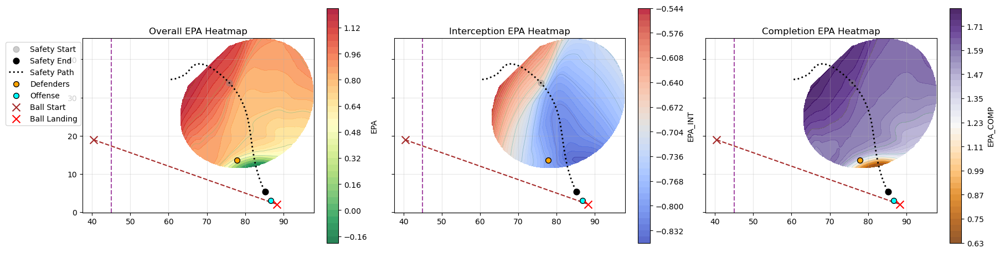

2023092411_2863


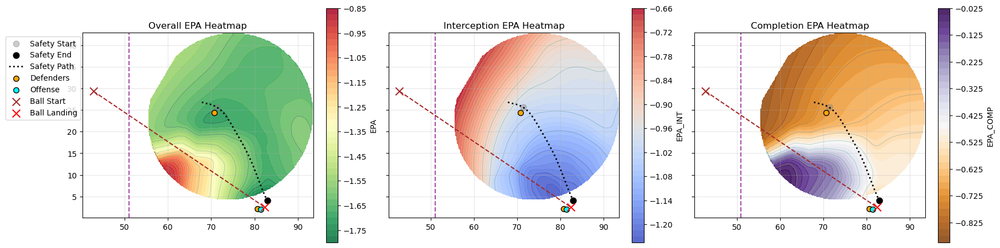

2023111201_1747


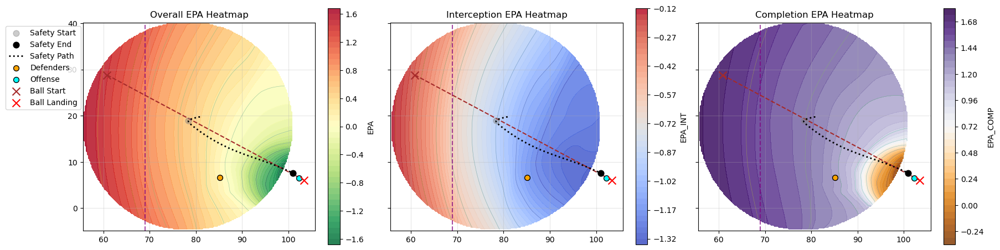

2023111201_1383


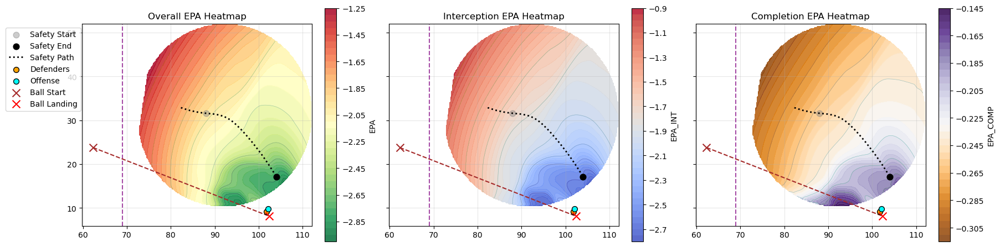

2023110600_2153


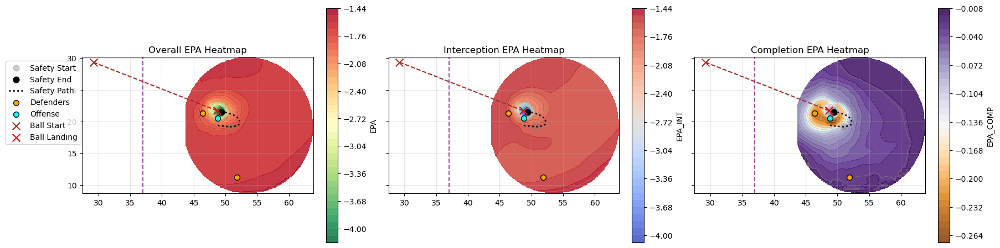

2023110509_494


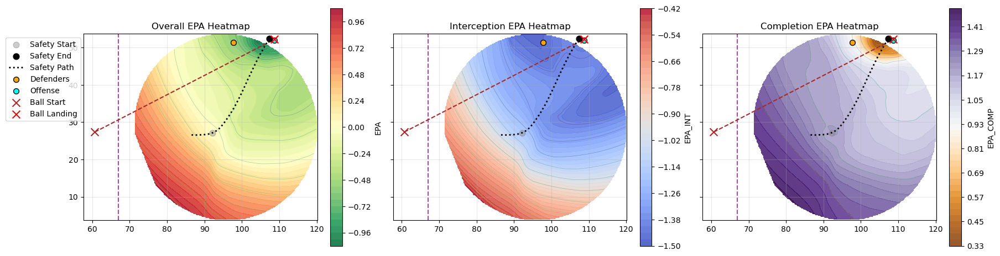

2023120306_1428


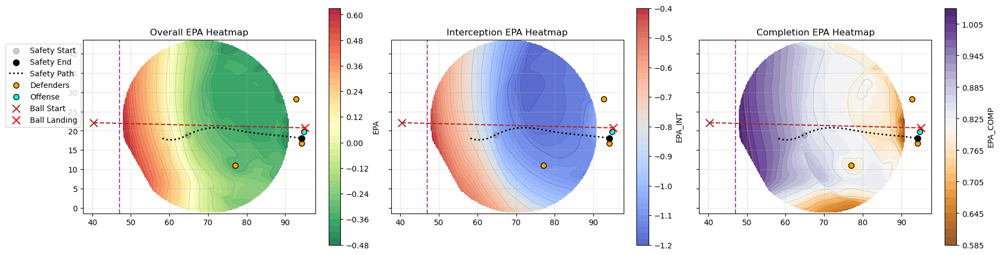

2023110505_2219


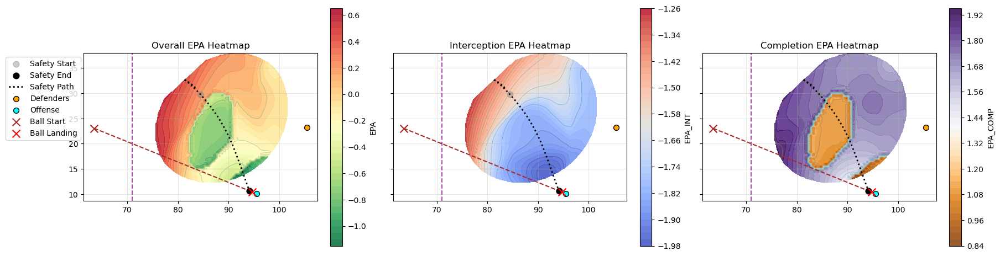

2023110505_1540


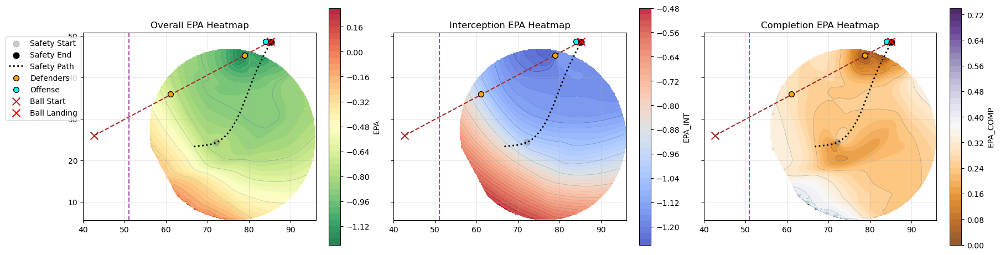

2023122402_3487


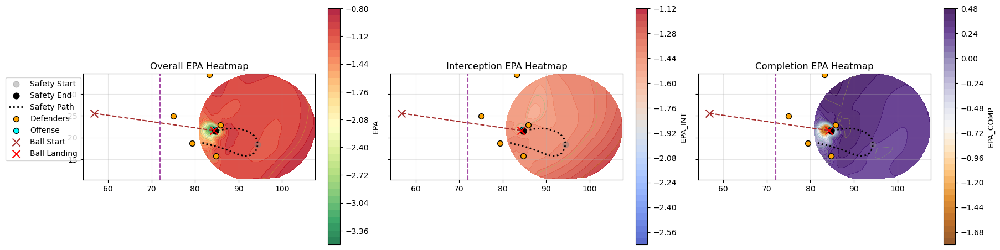

2023121703_2410


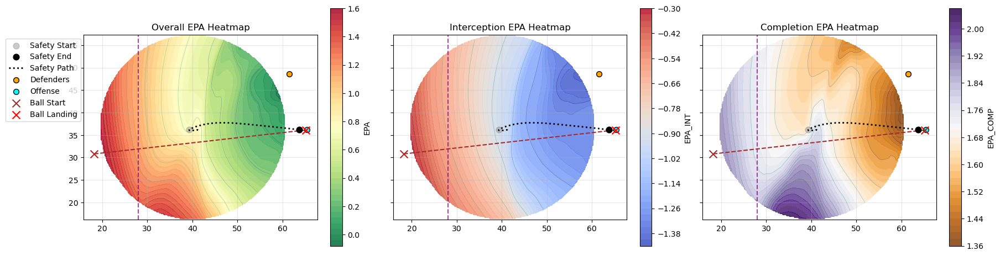

2023102910_2690


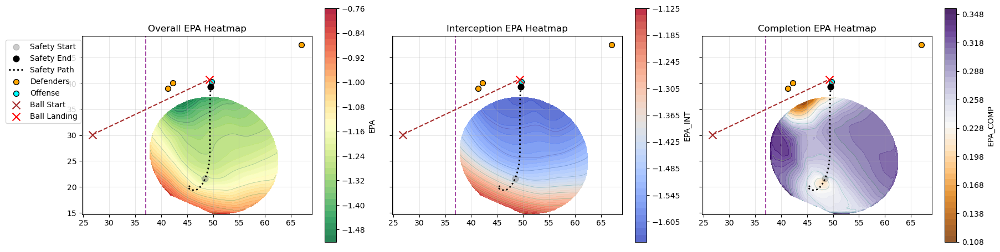

2023122406_813


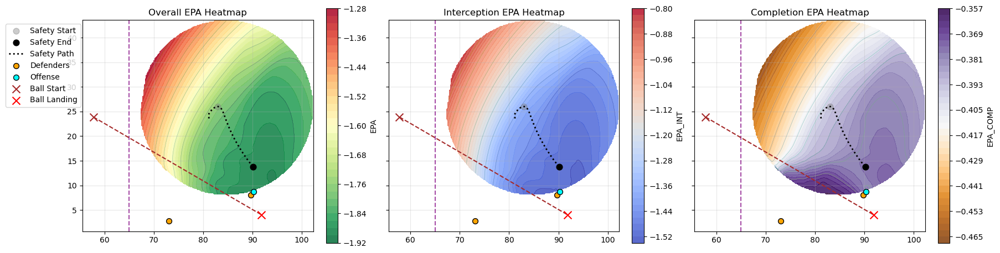

2023102908_621


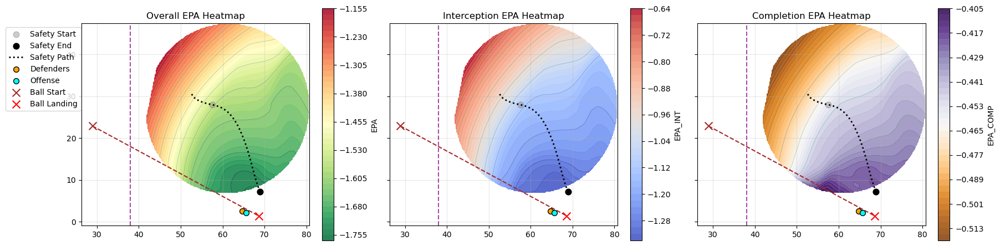

2023102907_475


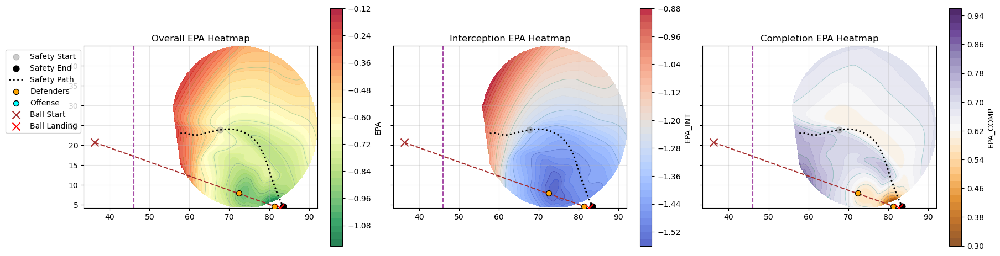

2023102907_3529


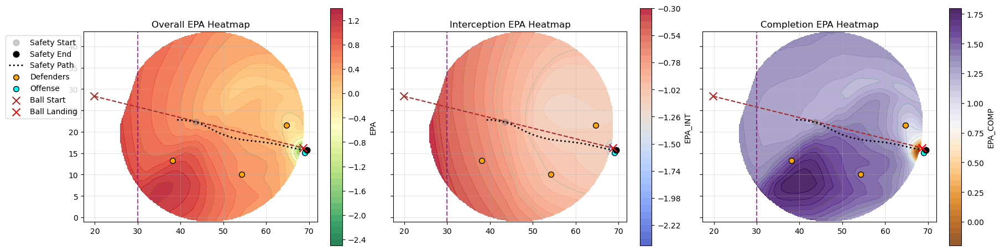

2023091008_3745


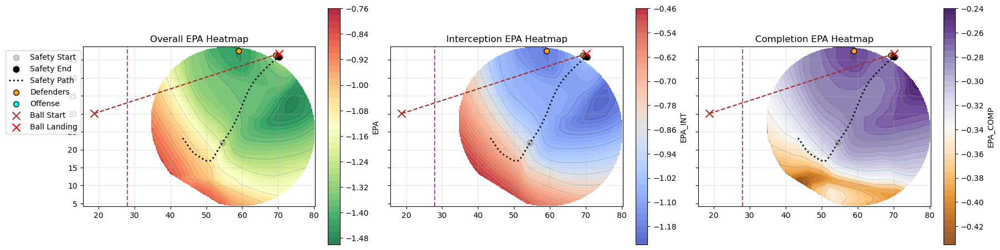

2023102903_580


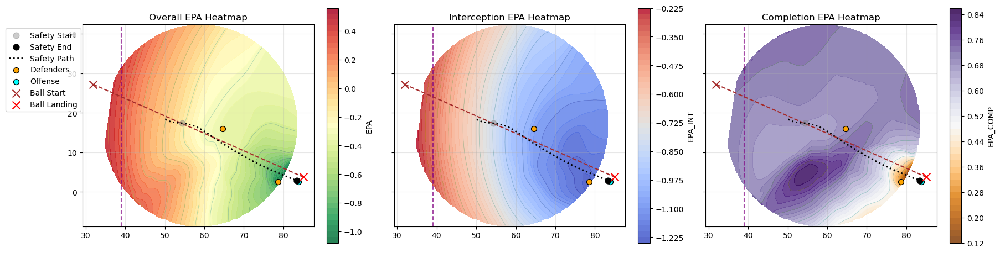

2023121703_3878


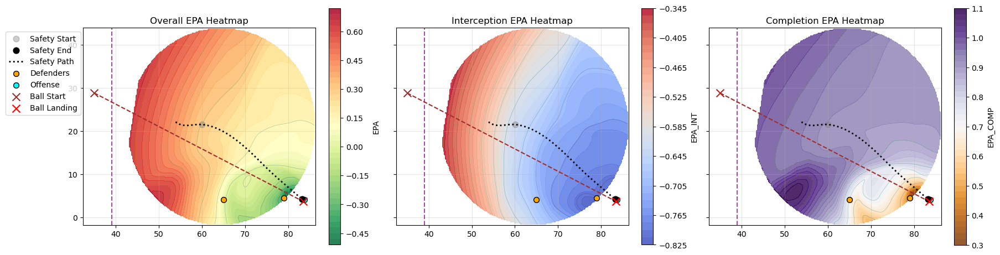

2023092405_3028


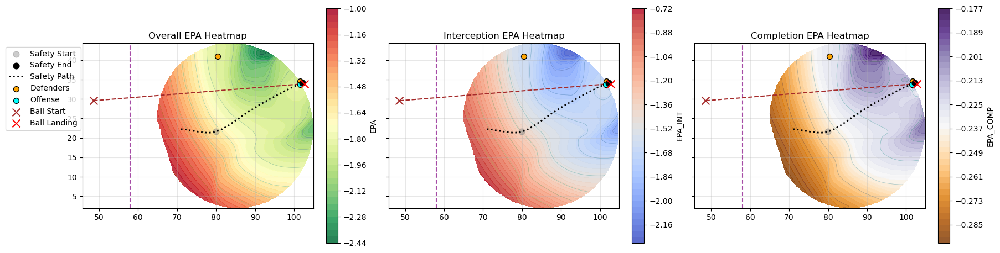

2023123104_80


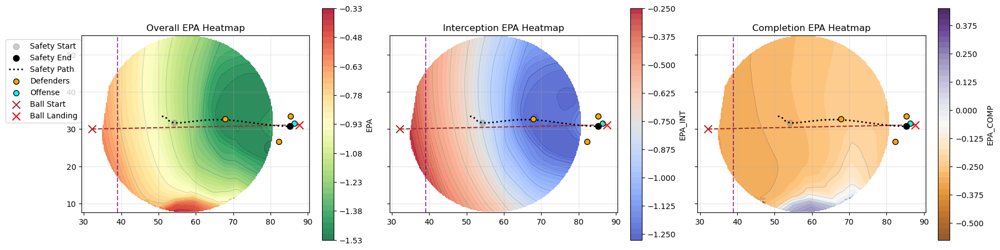

2023121004_4601


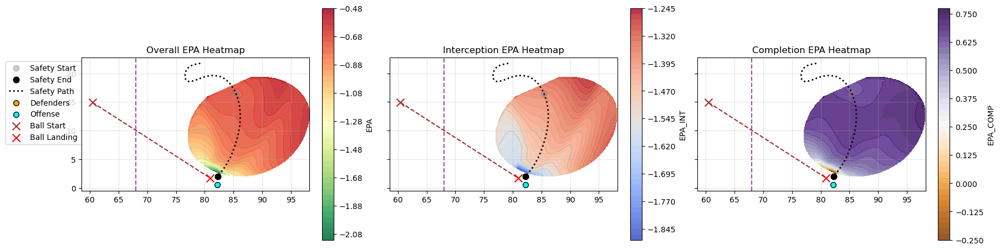

2023120308_2320


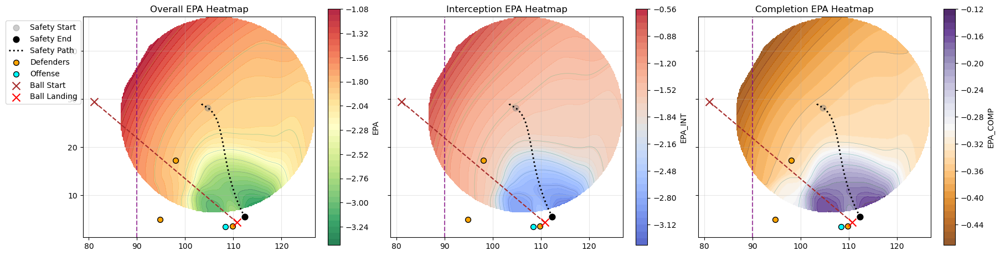

2023091709_4342


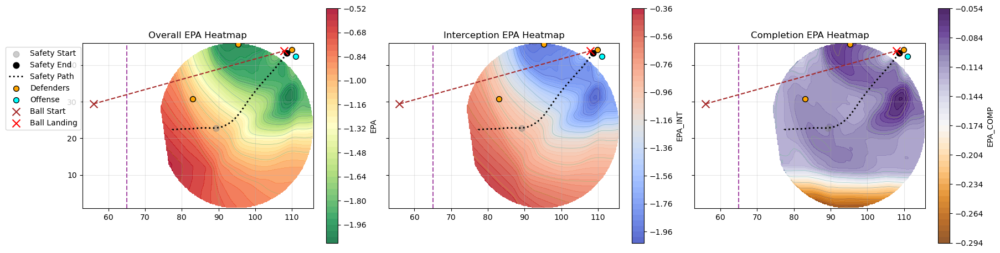

2023091800_1340


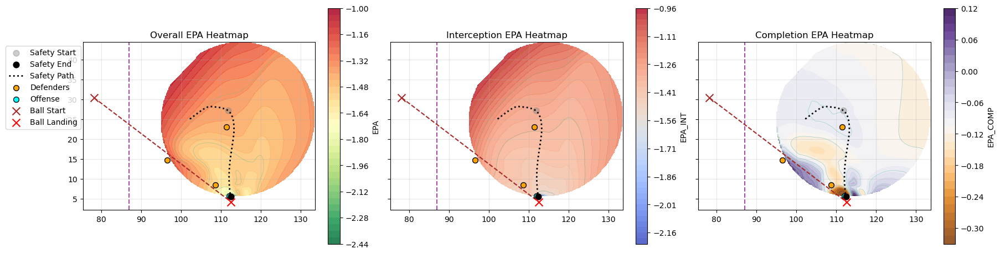

2023091708_3128


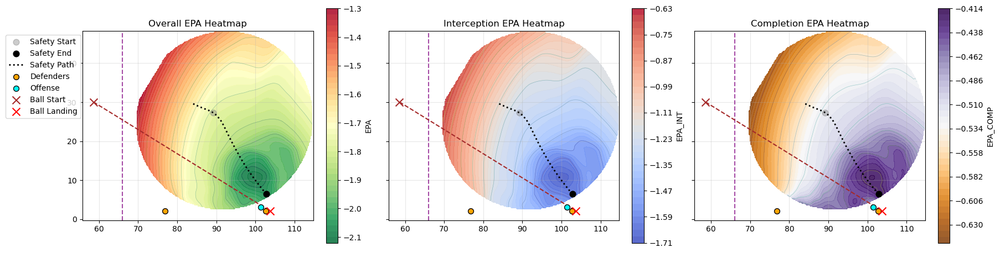

2023120302_3813


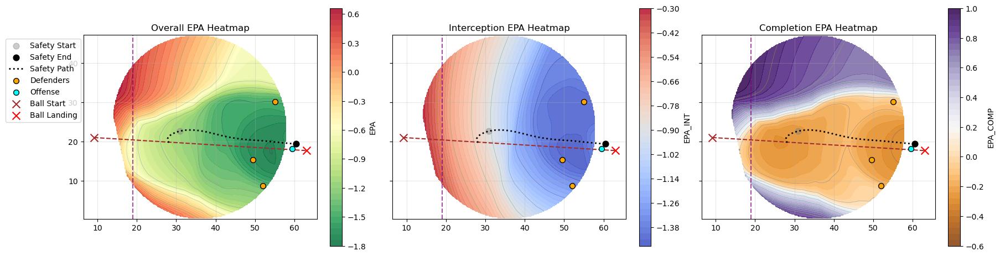

2023121001_547


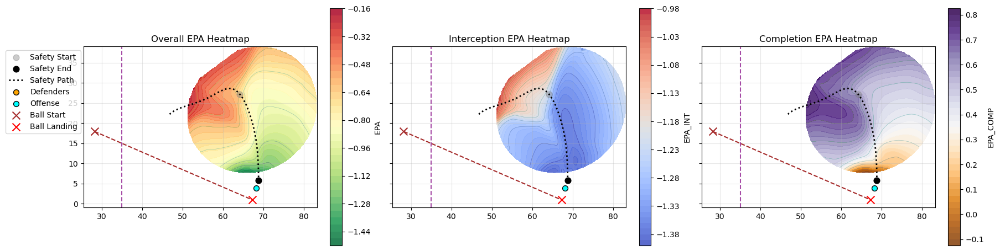

2023112700_397


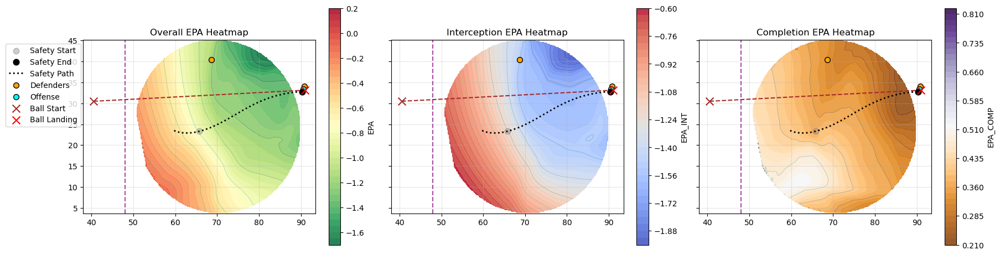

2023112604_1866


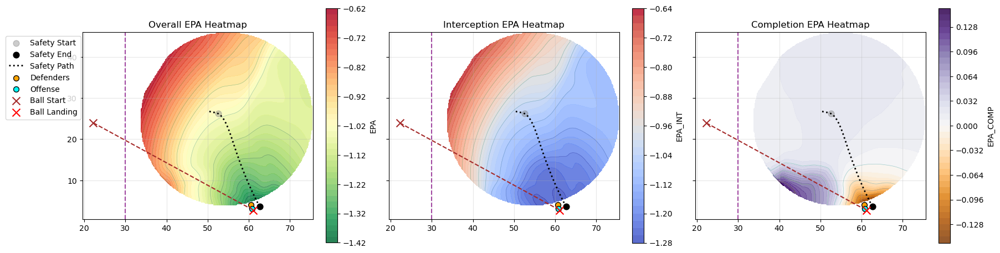

2023111600_977


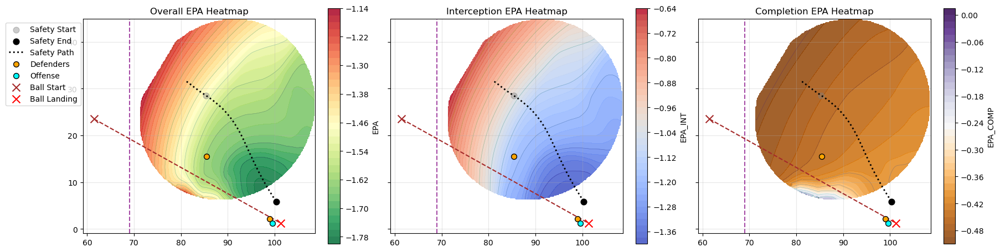

2023091705_3867


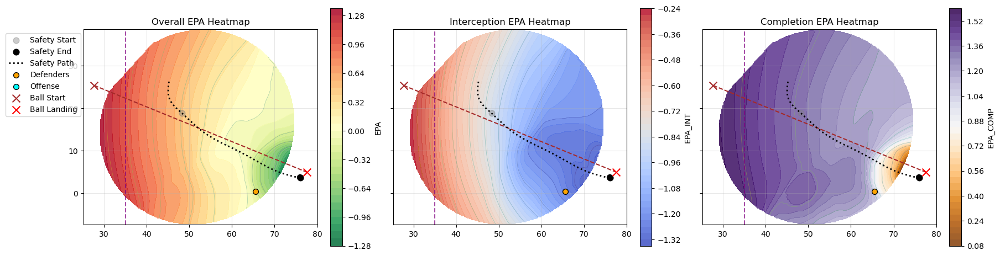

2023121005_1999


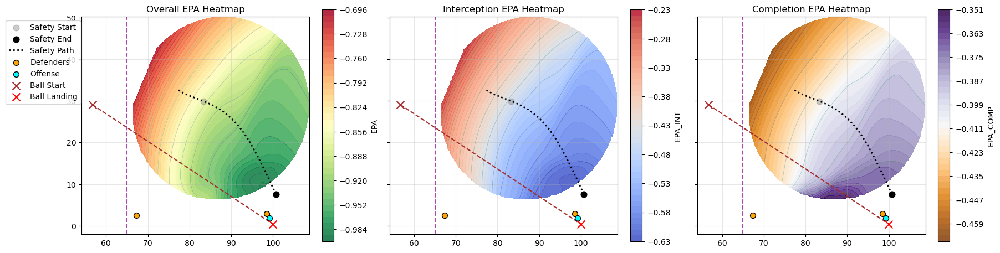

2023121009_816


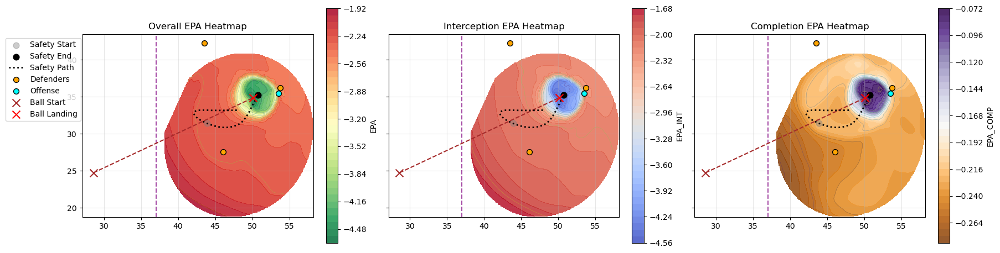

2023112301_305


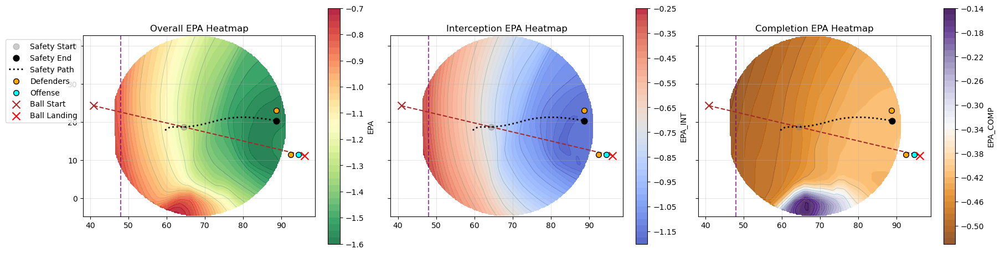

2023111902_3832


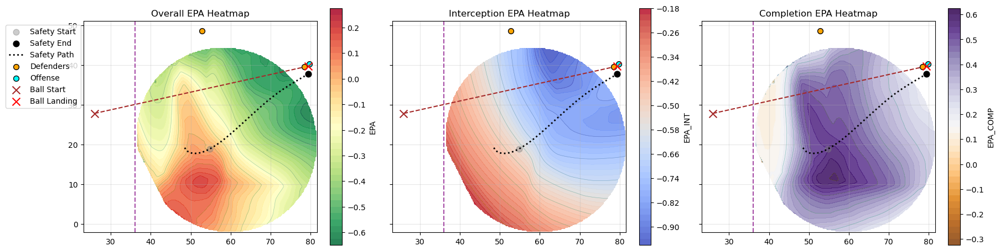

2023121600_4168


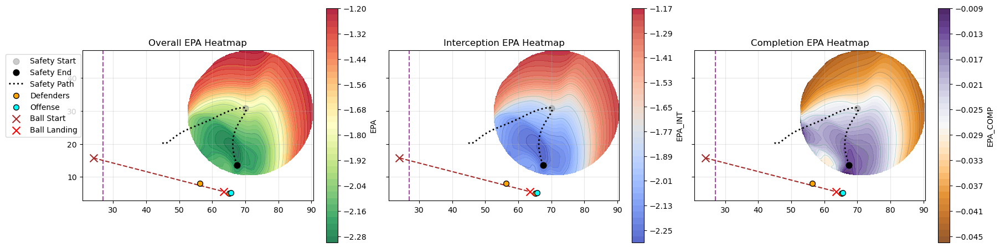

2023121602_115


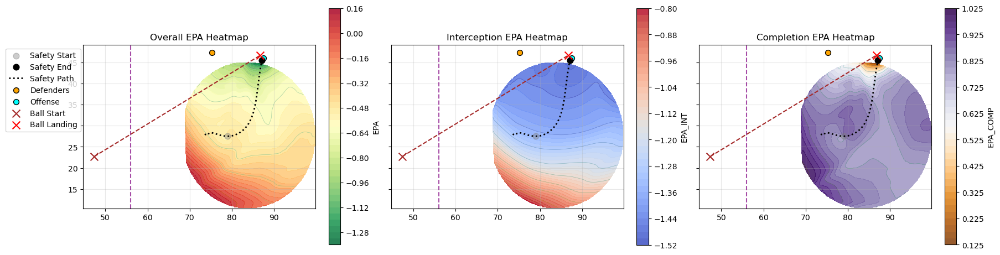

2023102903_3968


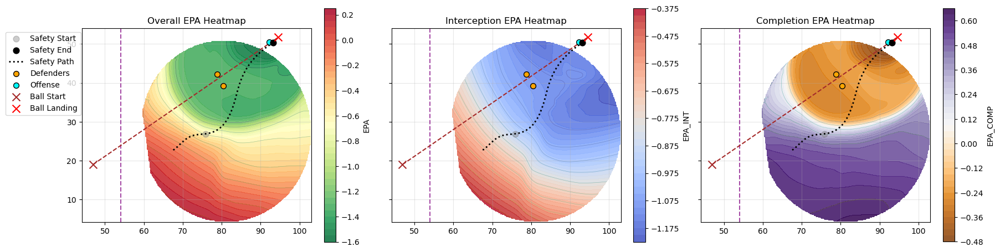

2023110506_869


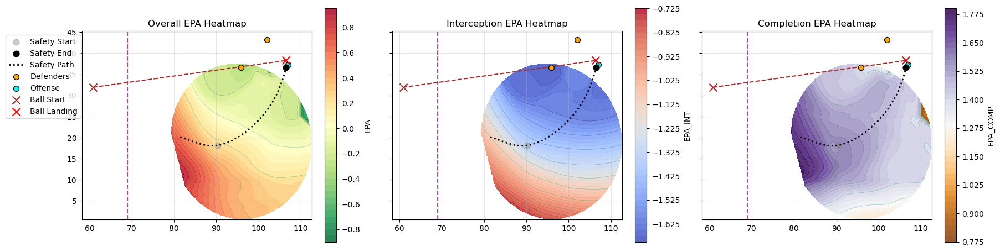

2023120305_1112


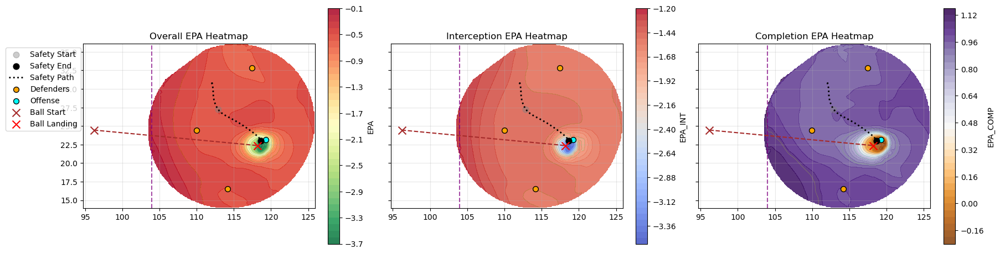

2023100107_2612


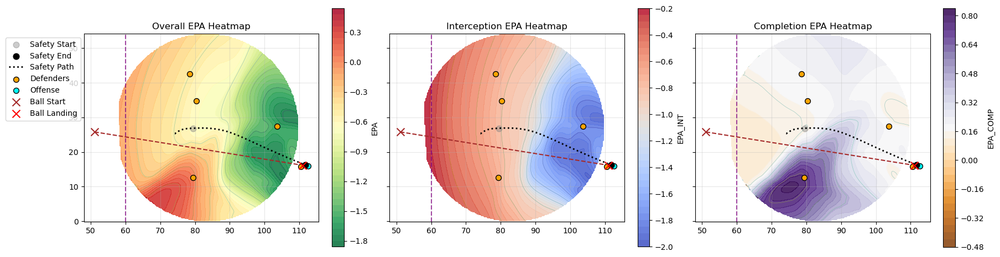

2023123114_2544


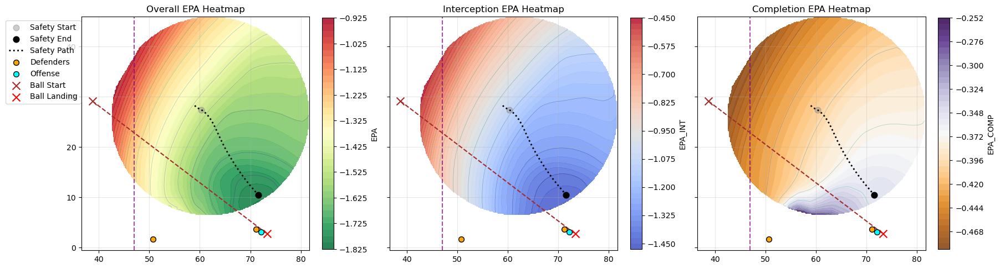

2023100109_461


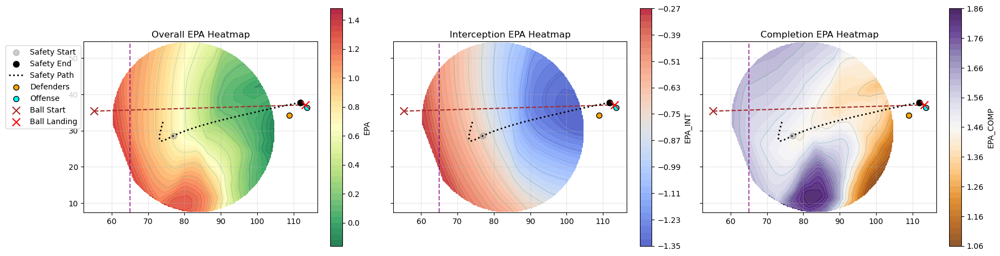

2023101510_1103


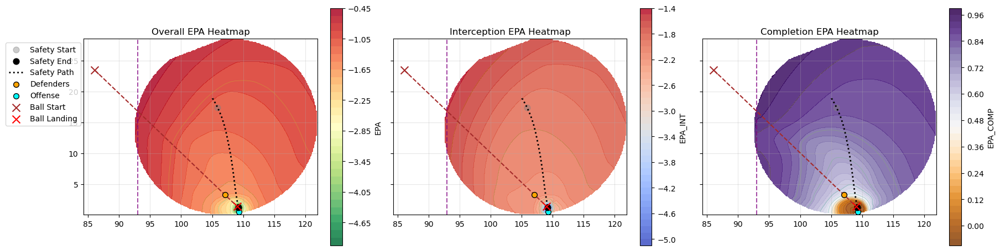

2023101511_1810


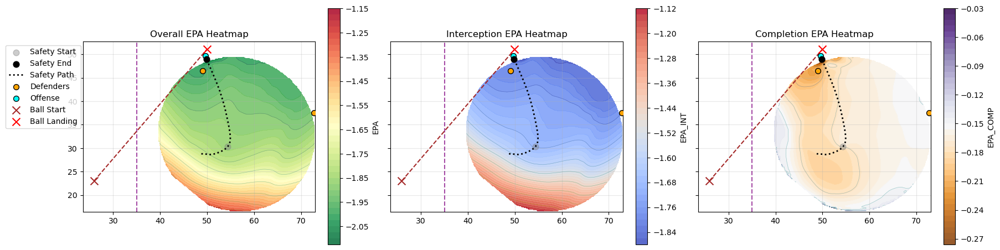

2023123112_2982


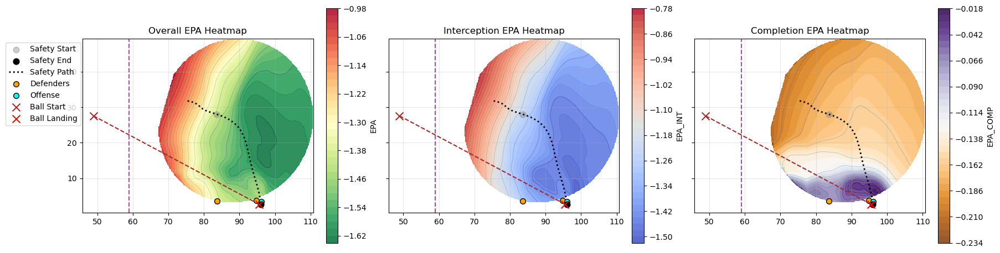

2023100808_938


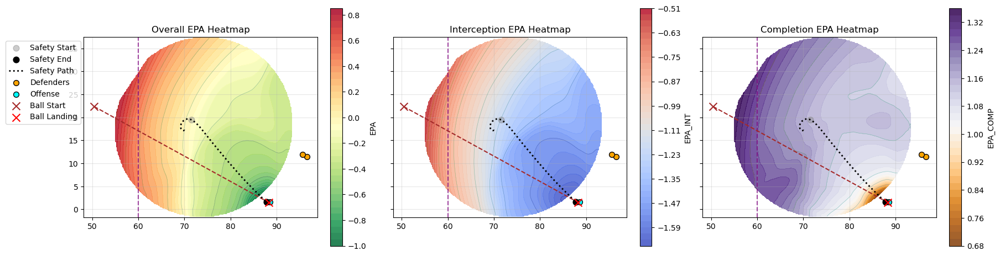

2023101504_3794


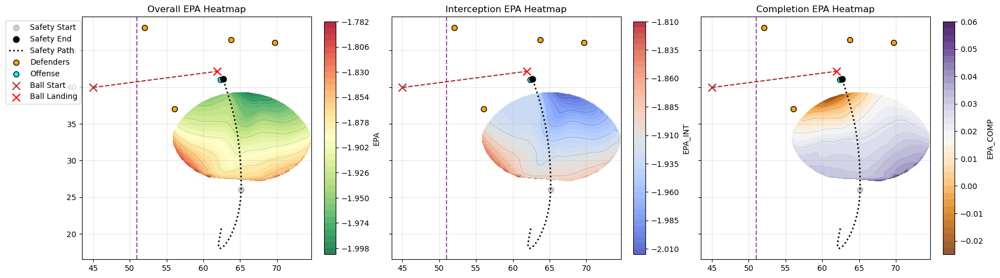

2023101504_2405


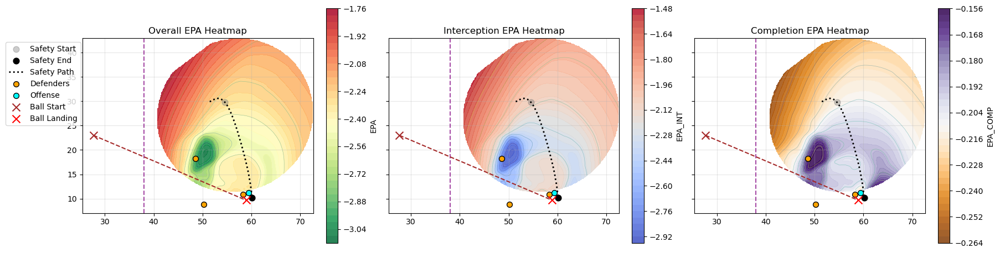

In [169]:
for gpid in gpids[:50]:
    example_df = results[results["gpid"] == gpid]
    print(gpid)
    plot_safety_reach_heatmaps(example_df, tracking=tracking)
    # cols = ['season','week','quarter','down','yards_to_go','possession_team',
    #         'defensive_team','safety_nfl_id','decision_eff_rank_epa',
    #         'decision_eff_percentile_epa','pass_result']
    # display(example_df[cols].drop_duplicates().reset_index(drop=True))

In [9]:
# gpid = '2024010711_1919'
gpid = '2023121602_115'
example_df = results[results["gpid"] == gpid]
plot_safety_reach_heatmaps(example_df, tracking=tracking)
cols = ['season','week','quarter','down','yards_to_go','possession_team',
        'defensive_team','play_description']
print(example_df[['decision_eff_rank_epa', 'decision_eff_rank_epa_int',
       'decision_eff_rank_epa_comp', 'decision_eff_rank_int']].head(1))
plays.query('gpid==@gpid')[cols].to_dict(orient='records')

NameError: name 'plot_safety_reach_heatmaps' is not defined

In [143]:
example_df.safety_nfl_id.unique()

array([48508])

In [125]:
# quantile ranke 0.997946 out of all results vals or decision_eff_rank_epa
from scipy.stats import percentileofscore

value = 0.915908

quantile_rank = percentileofscore(
    results[['gpid','safety_nfl_id','decision_eff_rank_epa_comp']].drop_duplicates(['gpid','safety_nfl_id']).decision_eff_rank_epa_comp,
    value, 
    kind='rank') / 100
quantile_rank

0.6954344624447717

In [126]:
# quantile ranke 0.997946 out of all results vals or decision_eff_rank_epa
from scipy.stats import percentileofscore

value = 0.63203

quantile_rank = percentileofscore(
    results[['gpid','safety_nfl_id','decision_eff_rank_epa_int']].drop_duplicates(['gpid','safety_nfl_id']).decision_eff_rank_epa_int,
    value, 
    kind='rank') / 100
quantile_rank

0.22945508100147274

In [109]:
players.query('nfl_id==52607')[['player_name']]

,player_name
604,Jordan Fuller


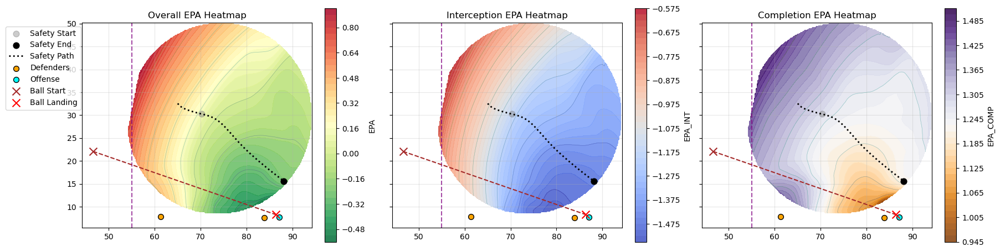

         decision_eff_rank_epa  decision_eff_rank_epa_int  \
7522924               0.915744                   0.962282   

         decision_eff_rank_epa_comp  decision_eff_rank_int  
7522924                    0.808032               0.962282  


[{'season': 2023,
  'week': 17,
  'quarter': 2,
  'down': 2,
  'yards_to_go': 5,
  'possession_team': 'JAX',
  'defensive_team': 'CAR',
  'play_description': '(4:01) (Shotgun) C.Beathard pass deep right to J.Agnew to CAR 7 for 48 yards (S.Griffin). JAX-J.Agnew was injured during the play.'}]

In [130]:
gpid = '2023123106_1453'
example_df = results[results["gpid"] == gpid]
plot_safety_reach_heatmaps(example_df, tracking=tracking)
cols = ['season','week','quarter','down','yards_to_go','possession_team',
        'defensive_team','play_description']
print(example_df[['decision_eff_rank_epa', 'decision_eff_rank_epa_int',
       'decision_eff_rank_epa_comp', 'decision_eff_rank_int']].head(1))
plays.query('gpid==@gpid')[cols].to_dict(orient='records')

In [124]:
plays.query('gpid==@gpid')

,gpid,game_id,play_id,absolute_yardline_number,num_frames_output,ball_land_x,ball_land_y,season,week,play_description,quarter,game_clock,down,yards_to_go,possession_team,defensive_team,yardline_side,yardline_number,pre_snap_home_score,pre_snap_visitor_score,play_nullified_by_penalty,pass_result,pass_length,offense_formation,receiver_alignment,route_of_targeted_receiver,play_action,dropback_type,dropback_distance,pass_location_type,defenders_in_the_box,team_coverage_man_zone,team_coverage_type,penalty_yards,pre_penalty_yards_gained,yards_gained_x,expected_points,expected_points_added,pre_snap_home_team_win_probability,pre_snap_visitor_team_win_probability,home_team_win_probability_added,visitor_team_win_probility_added,yards_gained_y,air_yards,yards_after_catch,pass_distance
2894,2023100106_1596,2023100106,1596,37,13,58.389999,23.65,2023,4,(3:59) (Shotgun) A.Richardson pass deep middle...,2,03:59,2,19,IND,LA,IND,27,0,20,N,C,26,SHOTGUN,2x2,POST,False,TRADITIONAL,3.02,INSIDE_BOX,6,ZONE_COVERAGE,COVER_6_ZONE,NaN,30,30,0.394583,2.37109,0.066865,0.933135,0.018506,-0.018506,30.0,26.0,4.0,29.750408


In [131]:
example_df.safety_nfl_id.unique()

array([43350])

In [80]:
# print quantile of decision_eff_rank_epa
for q in [0.1, 0.25, 0.5, 0.75, 0.9]:
    val = results['decision_eff_rank_epa'].quantile(q)
    print(f'Quantile {q}: {val:.2f}')

Quantile 0.1: 0.54
Quantile 0.25: 0.73
Quantile 0.5: 0.89
Quantile 0.75: 0.97
Quantile 0.9: 1.00


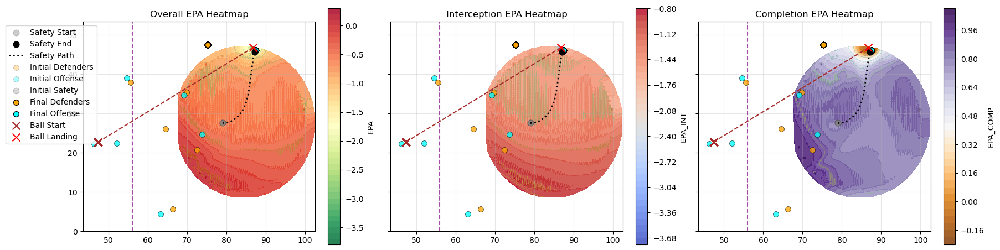

   decision_eff_rank_epa  decision_eff_rank_epa_int  \
0               0.997348                    0.99558   

   decision_eff_rank_epa_comp  decision_eff_rank_int  
0                    0.998863                0.99558  


[{'season': 2023,
  'week': 15,
  'quarter': 1,
  'down': 1,
  'yards_to_go': 10,
  'possession_team': 'DET',
  'defensive_team': 'DEN',
  'play_description': '(14:00) J.Goff pass incomplete deep left to J.Williams (J.Simmons).'}]

In [13]:
gpid = '2023121602_115'
example_df = results[results["gpid"] == gpid]
tracking_qry = (
    tracking.query("gpid == @gpid")
    .merge(
        tracking
            .query("gpid == @gpid & pass_thrown")
            .sort_values("frame_id")
            .rename(columns={"frame_id": "pass_frame_id"})
            [["gpid", "pass_frame_id"]],
        on="gpid",
        how="left"
    )
    .assign(
        one_sec_before=lambda x: np.maximum(x["pass_frame_id"] - 10, 0)
    )
    .query("frame_id >= one_sec_before")
) 
plot_safety_reach_heatmap(example_df, tracking=tracking_qry)
cols = ['season','week','quarter','down','yards_to_go','possession_team',
        'defensive_team','play_description']
print(example_df[['decision_eff_rank_epa', 'decision_eff_rank_epa_int',
       'decision_eff_rank_epa_comp', 'decision_eff_rank_int']].head(1))
plays.query('gpid==@gpid')[cols].to_dict(orient='records')

In [14]:
example_df.safety_nfl_id.unique()

array([43387])

In [35]:
plays.head()

,gpid,game_id,play_id,absolute_yardline_number,num_frames_output,ball_land_x,ball_land_y,season,week,play_description,quarter,game_clock,down,yards_to_go,possession_team,defensive_team,yardline_side,yardline_number,pre_snap_home_score,pre_snap_visitor_score,play_nullified_by_penalty,pass_result,pass_length,offense_formation,receiver_alignment,route_of_targeted_receiver,play_action,dropback_type,dropback_distance,pass_location_type,defenders_in_the_box,team_coverage_man_zone,team_coverage_type,penalty_yards,pre_penalty_yards_gained,yards_gained_x,expected_points,expected_points_added,pre_snap_home_team_win_probability,pre_snap_visitor_team_win_probability,home_team_win_probability_added,visitor_team_win_probility_added,yards_gained_y,air_yards,yards_after_catch,pass_distance
0,2023090700_101,2023090700,101,42,21,63.259998,-0.22,2023,1,(14:25) (Shotgun) J.Goff pass incomplete deep ...,1,14:25,3,3,DET,KC,DET,32,0,0,N,I,22,SHOTGUN,2x2,CORNER,False,TRADITIONAL,2.13,INSIDE_BOX,6,ZONE_COVERAGE,COVER_2_ZONE,NaN,0,0,0.927021,-2.145443,0.590426,0.409574,0.049720,-0.049720,0.0,22.0,NaN,41.088520
1,2023090700_194,2023090700,194,31,9,35.059998,31.55,2023,1,(12:56) (Shotgun) P.Mahomes pass short left to...,1,12:56,3,2,KC,DET,KC,21,0,0,N,C,6,SHOTGUN,2x2,ANGLE,False,TRADITIONAL,3.86,INSIDE_BOX,6,MAN_COVERAGE,COVER_1_MAN,NaN,10,10,0.121505,1.702563,0.582476,0.417524,0.047277,-0.047277,10.0,6.0,4.0,14.950209
2,2023090700_219,2023090700,219,41,8,44.150002,41.81,2023,1,(12:20) (Shotgun) P.Mahomes pass short left to...,1,12:20,1,10,KC,DET,KC,31,0,0,N,C,4,SHOTGUN,2x2,HITCH,False,TRADITIONAL,2.37,INSIDE_BOX,6,ZONE_COVERAGE,COVER_4_ZONE,NaN,5,5,1.824068,0.089352,0.629753,0.370247,0.000420,-0.000420,5.0,4.0,1.0,15.237809
3,2023090700_361,2023090700,361,22,16,26.100000,49.18,2023,1,(10:06) (Shotgun) J.Goff pass short left to M....,1,10:06,3,7,DET,KC,DET,12,0,0,N,C,5,SHOTGUN,3x1,HITCH,False,TRADITIONAL,3.03,OUTSIDE_RIGHT,6,ZONE_COVERAGE,COVER_4_ZONE,NaN,5,5,-1.049160,-0.862062,0.606310,0.393690,0.019525,-0.019525,5.0,5.0,0.0,29.842495
4,2023090700_436,2023090700,436,31,7,34.889999,34.82,2023,1,(8:09) (Shotgun) J.Goff pass short left to A.S...,1,08:09,2,9,DET,KC,DET,21,0,0,N,C,6,SHOTGUN,2x2,SLANT,False,TRADITIONAL,2.55,INSIDE_BOX,6,MAN_COVERAGE,COVER_1_MAN,NaN,13,13,0.312204,1.613927,0.575537,0.424463,-0.030918,0.030918,13.0,6.0,7.0,12.158770


In [36]:
plays.possession_team.unique()

array(['DET', 'KC', 'CAR', 'ATL', 'BAL', 'HOU', 'CIN', 'CLE', 'IND',
       'JAX', 'MIN', 'TB', 'TEN', 'NO', 'PIT', 'SF', 'WAS', 'ARI', 'CHI',
       'GB', 'LV', 'DEN', 'MIA', 'LAC', 'PHI', 'NE', 'SEA', 'LA', 'NYG',
       'DAL', 'BUF', 'NYJ'], dtype=object)

In [41]:
state = {
    'season': 2023,
    'week': 18,
    'possession_team': 'PHI',
    'game_clock': "01:34"
}
plays[
    (plays['season'] == state['season']) &
    (plays['week'] == state['week']) &
    (plays['possession_team'] == state['possession_team']) &
    (plays['game_clock'] == state['game_clock'])
].gpid.values[0]

'2024010711_1919'

In [43]:
plays.query('gpid=="2024010711_1919"')

,gpid,game_id,play_id,absolute_yardline_number,num_frames_output,ball_land_x,ball_land_y,season,week,play_description,quarter,game_clock,down,yards_to_go,possession_team,defensive_team,yardline_side,yardline_number,pre_snap_home_score,pre_snap_visitor_score,play_nullified_by_penalty,pass_result,pass_length,offense_formation,receiver_alignment,route_of_targeted_receiver,play_action,dropback_type,dropback_distance,pass_location_type,defenders_in_the_box,team_coverage_man_zone,team_coverage_type,penalty_yards,pre_penalty_yards_gained,yards_gained_x,expected_points,expected_points_added,pre_snap_home_team_win_probability,pre_snap_visitor_team_win_probability,home_team_win_probability_added,visitor_team_win_probility_added,yards_gained_y,air_yards,yards_after_catch,pass_distance
13981,2024010711_1919,2024010711,1919,37,27,72.169998,51.94,2023,18,(1:34) (Shotgun) J.Hurts pass incomplete deep ...,2,01:34,3,8,PHI,NYG,PHI,27,24,0,N,IN,37,SHOTGUN,2x2,GO,False,TRADITIONAL,4.78,INSIDE_BOX,5,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0,0.357569,-2.189347,0.967862,0.032138,0.005443,-0.005443,0.0,37.0,NaN,49.65625


In [61]:
results.query('gpid=="2024010711_1919"').head()

,gpid,safety_nfl_id,sample_type,x,y,vx,vy,start_x,start_y,start_dir,start_s,predicted_cmp,predicted_yac,predicted_int,absolute_yardline_number,ball_land_x,ball_land_y,num_frames_output,EPA_INT,EPA_COMP,EPA,decision_eff_rank_epa,decision_eff_rank_epa_int,decision_eff_rank_epa_comp,decision_eff_rank_int
0,2024010711_1919,52444,original,71.890000,51.740000,5.097760,4.797171,54.3,33.0,1.06,5.31,0.187386,1.990241,0.360439,37,72.169998,51.94,27,-0.975648,-0.304725,-1.280373,0.997946,0.616922,0.998768,0.616922
1,2024010711_1919,52444,simulated,83.510677,33.363433,7.999381,0.099527,54.3,33.0,1.06,5.31,0.379288,6.304150,0.387638,37,72.169998,51.94,27,-1.049271,0.211686,-0.837585,0.997946,0.616922,0.998768,0.616922
2,2024010711_1919,52444,simulated,83.487494,34.199731,7.993250,0.328557,54.3,33.0,1.06,5.31,0.378390,6.350963,0.387810,37,72.169998,51.94,27,-1.049735,0.210175,-0.839560,0.997946,0.616922,0.998768,0.616922
3,2024010711_1919,52444,simulated,83.430504,35.136652,7.978567,0.585208,54.3,33.0,1.06,5.31,0.376900,6.398917,0.388066,37,72.169998,51.94,27,-1.050429,0.207199,-0.843230,0.997946,0.616922,0.998768,0.616922
4,2024010711_1919,52444,simulated,83.319544,36.250250,7.950289,0.890449,54.3,33.0,1.06,5.31,0.375018,6.482858,0.388250,37,72.169998,51.94,27,-1.050928,0.203847,-0.847081,0.997946,0.616922,0.998768,0.616922


In [63]:
tracking.head()

,gpid,game_id,play_id,frame_id,nfl_id,pass_thrown,player_to_predict,player_side,player_role,position,x,y,s,a,dir,o,is_passer,is_receiver,is_interceptor
0,2023090700_1001,2023090700,1001,1,0,False,False,Ball,Ball,Ball,104.71,23.60,0.06,NaN,180.00,NaN,False,False,False
1,2023090700_1001,2023090700,1001,2,0,False,False,Ball,Ball,Ball,104.68,23.60,0.10,NaN,161.57,NaN,False,False,False
2,2023090700_1001,2023090700,1001,3,0,False,False,Ball,Ball,Ball,104.65,23.61,0.39,NaN,161.57,NaN,False,False,False
3,2023090700_1001,2023090700,1001,4,0,False,False,Ball,Ball,Ball,104.59,23.63,0.71,NaN,167.47,NaN,False,False,False
4,2023090700_1001,2023090700,1001,5,0,False,False,Ball,Ball,Ball,104.50,23.65,1.04,NaN,170.54,NaN,False,False,False


In [64]:
tracking.player_side.unique()

array(['Ball', 'Offense', 'Defense'], dtype=object)

In [65]:
tracking.columns

Index(['gpid', 'game_id', 'play_id', 'frame_id', 'nfl_id', 'pass_thrown',
       'player_to_predict', 'player_side', 'player_role', 'position', 'x', 'y',
       's', 'a', 'dir', 'o', 'is_passer', 'is_receiver', 'is_interceptor'],
      dtype='object')